# 3D Erythrocyte Reconstruction from Interferograms

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [1507]:
img = cv2.imread("erythrocite_images/presentation_img.png", cv2.IMREAD_GRAYSCALE)

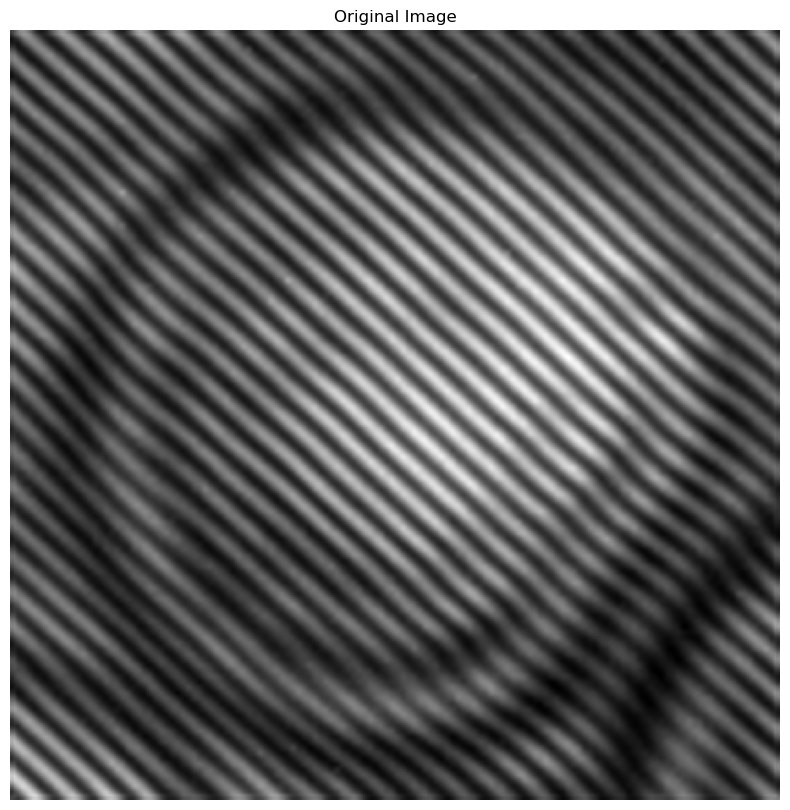

In [1509]:
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.title("Original Image")
plt.axis("off")
plt.show()

## 2D Fourier transform

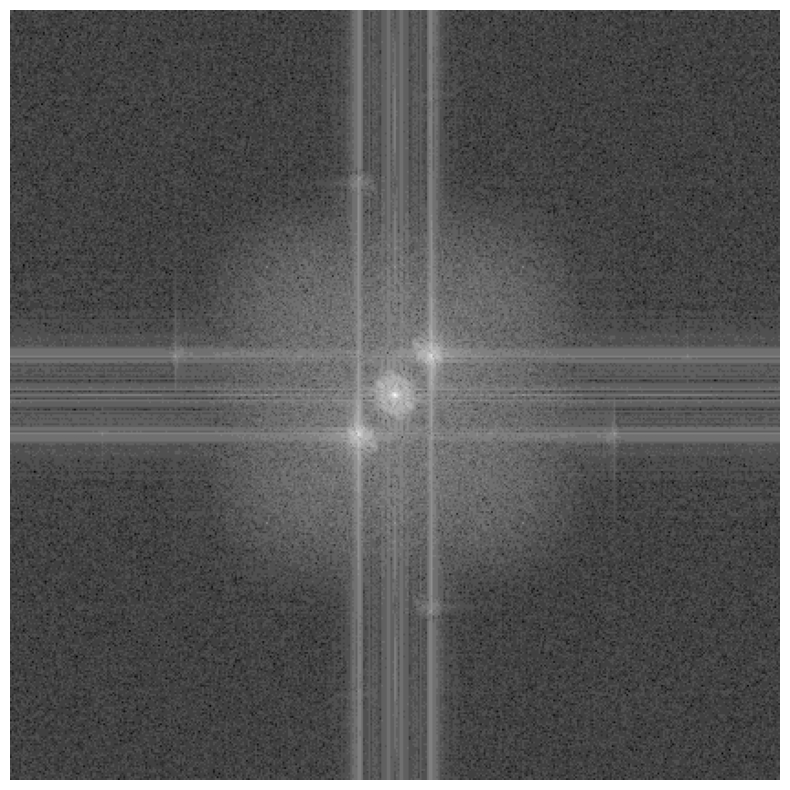

In [1512]:
fft = np.fft.fftshift(np.fft.fft2(img))
spectrum = np.log(1 + np.abs(fft))
plt.figure(figsize=(10, 10))
plt.imshow(spectrum.astype(np.uint8), cmap='gray')
plt.axis('off')
plt.show()

## Finding the first order

In [1515]:
def mask_center(img, radius = 10, rotation90 = 0):
    h, w = img.shape
    cy, cx = h//2, w//2
    mask_radius = 15
    Y, X = np.ogrid[:h, :w]
    mask = ((X-cx)**2 + (Y-cy)**2 <= mask_radius**2) | ~((X >= cx) & (Y <= cy))
    mask = np.rot90(mask, rotation90)
    img_masked = img.copy()
    img_masked[mask] = 0
    return img_masked


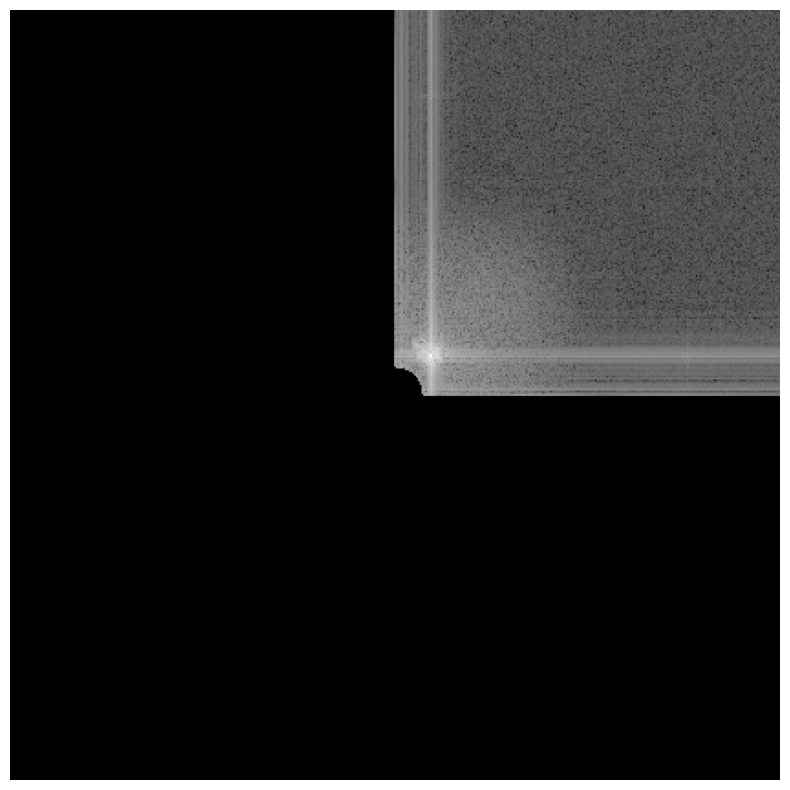

In [1517]:
spectrum_masked = mask_center(spectrum)

plt.figure(figsize=(10, 10))
plt.imshow(spectrum_masked, cmap='gray')
plt.axis('off')
plt.show()

In [1519]:
def find_plus_one_order_position(img, mask_radius=15, rotation90 = 0):
    h, w = img.shape
    cy, cx = h//2, w//2
    spectrum_img = img.copy()
    spectrum_masked = mask_center(spectrum_img, rotation90=rotation90)
    f_y, f_x = np.unravel_index(np.argmax(spectrum_masked), spectrum_masked.shape)
    return f_x, f_y

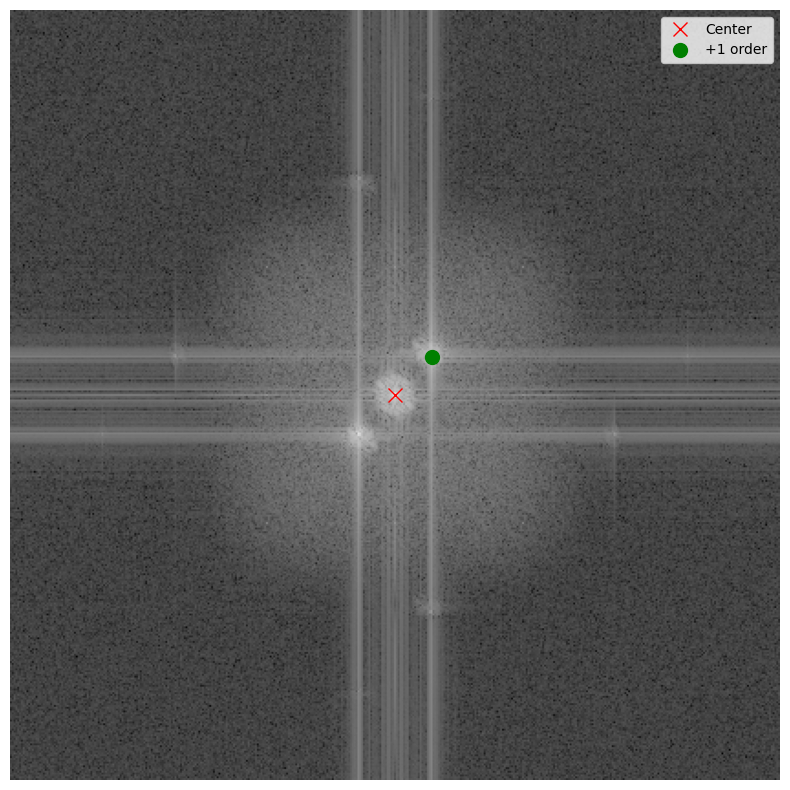

In [1521]:
h, w = img.shape
cy, cx = h//2, w//2

f_x, f_y = find_plus_one_order_position(spectrum)

plt.figure(figsize=(10, 10))
plt.imshow(spectrum, cmap='gray')
plt.plot(cx, cy, 'rx', markersize=10, label='Center')
plt.plot(f_x, f_y, 'go', markersize=10, label='+1 order')
plt.legend()
plt.axis('off')
plt.show()
     

## Isolating the +1 order

In [1524]:
def get_spectrum_image_from_fft(fft):
    return np.log(1 + np.abs(fft))
    

In [1526]:
def filter_spectrum(fft, f_x, f_y, radius=20):
    h, w = fft.shape
    cy, cx = h//2, w//2

    filter_mask = np.zeros((h, w), dtype=bool)
    Y, X = np.ogrid[:h, :w]
    dist_sq = (Y - f_y)**2 + (X - f_x)**2
    filter_mask = dist_sq < radius**2
    fft_filtered = np.zeros_like(fft)
    fft_filtered[filter_mask] = fft[filter_mask]
    return fft_filtered

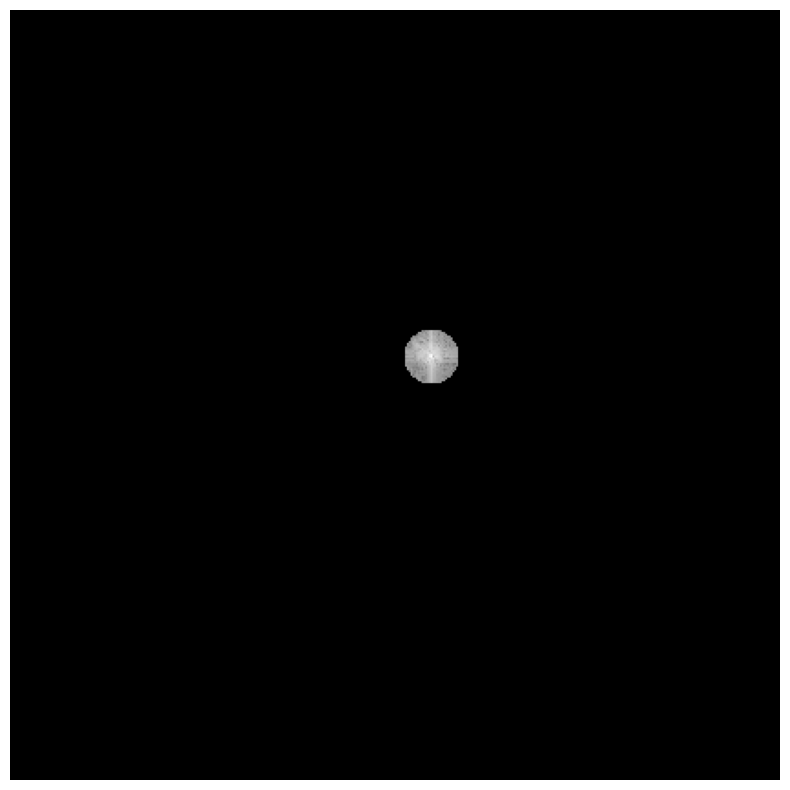

In [1528]:
filtered_spectrum = filter_spectrum(fft, f_x, f_y, radius=15)

plt.figure(figsize=(10, 10))
plt.imshow(get_spectrum_image_from_fft(filtered_spectrum), cmap='gray')
plt.axis('off')
plt.show()

## Moving the first order to the image center

In [1531]:
def center_spectrum(fft, f_x, f_y):
    h, w = fft.shape
    c_y, c_x = h//2, w//2
    spectrum_centred = np.roll(fft, -int(f_y - c_y), axis=0)
    spectrum_centred = np.roll(spectrum_centred, -int(f_x - c_x), axis=1)
    return spectrum_centred
    

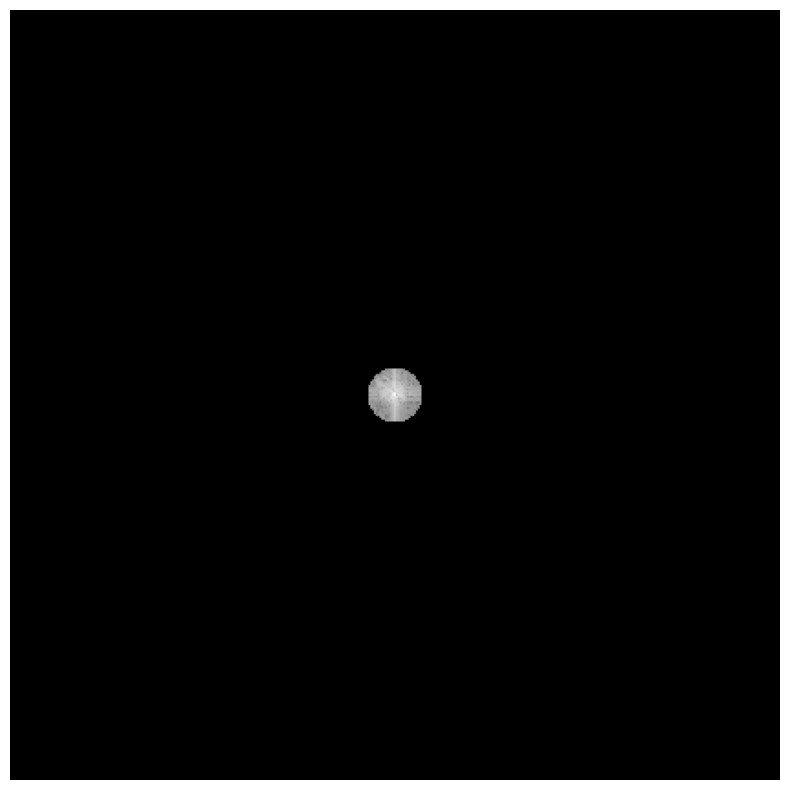

In [1533]:
centered_spectrum = center_spectrum(filtered_spectrum, f_x, f_y)

plt.figure(figsize=(10, 10))
plt.imshow(get_spectrum_image_from_fft(centered_spectrum) , cmap='gray')
plt.axis('off')
plt.show()

## Reverse Fourier Transform

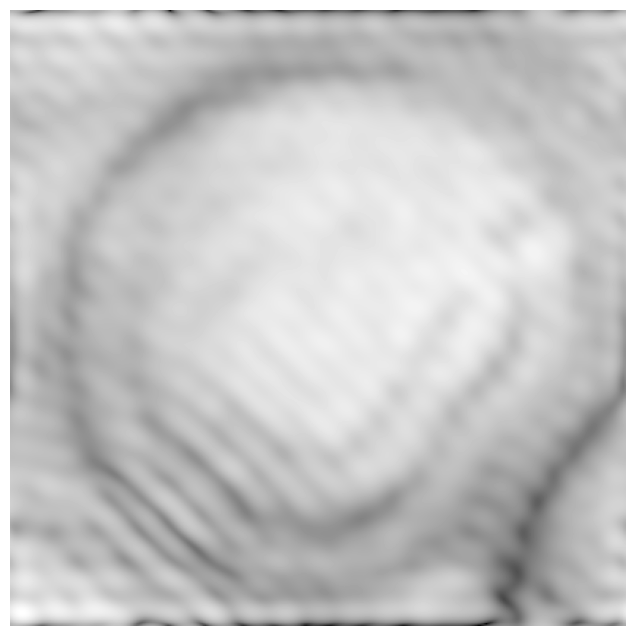

In [1041]:
amplitude = np.fft.ifft2(np.fft.ifftshift(centered_spectrum))

plt.figure(figsize=(8, 8))
plt.imshow(get_spectrum_image_from_fft(image_from_centered_spectrum), cmap='gray')
plt.axis('off')
plt.show()

## Calculating the phase as a complex part of the signal

In [1044]:
phase_wrapped = np.angle(amplitude)

phase_unwrapped = np.unwrap(np.unwrap(phase_wrapped, axis=1), axis=0)

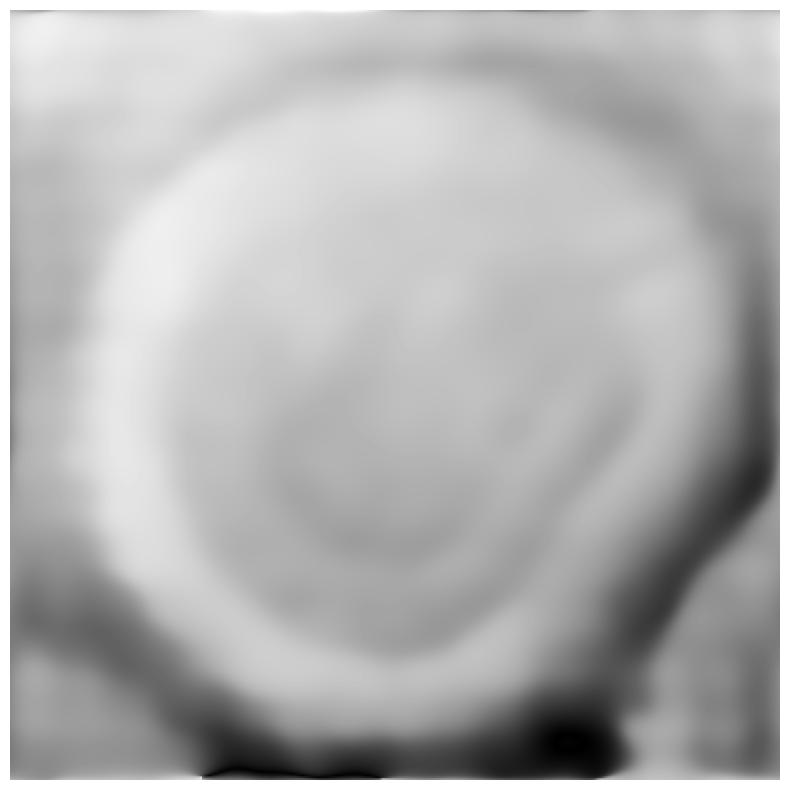

In [1046]:
plt.figure(figsize=(10, 10))
plt.imshow(get_spectrum_image_from_fft(phase_unwrapped), cmap='gray')
plt.axis('off')
plt.show()

## Creating a 3D plot

In [1459]:
def plot_3D_phase(phase, pixel_size = 2.2, wavelength = 0.65, zoom = 80, standalone=True):
    h, w = phase.shape

    step = 1
    x = np.arange(0, w, step)
    y = np.arange(0, h, step)
    X_3d, Y_3d = np.meshgrid(x, y)
    Z_3d = phase[::step, ::step]
    
    X_microns = X_3d * pixel_size / zoom
    Y_microns = Y_3d * pixel_size / zoom
    Z_microns = Z_3d * wavelength / (2 * np.pi)

    fig = None
    ax = None
    if(standalone):
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(111, projection='3d')
    else:
        fig = plt.gcf()
        ax = plt.gca()
        
    
    z_min = Z_microns.min()
    z_max = Z_microns.max()
    
    surf = ax.plot_surface(X_microns, Y_microns, Z_microns,
                          cmap='turbo',
                          alpha=0.9,
                          linewidth=0.1,
                          antialiased=True,
                          vmin=z_min,
                          vmax=z_max)
    
    fig.colorbar(surf, shrink=0.5, aspect=10, label='Height (μm)')
    ax.view_init(elev=30, azim=45)
    
    ax.set_xlabel('X (μm)')
    ax.set_ylabel('Y (μm)')

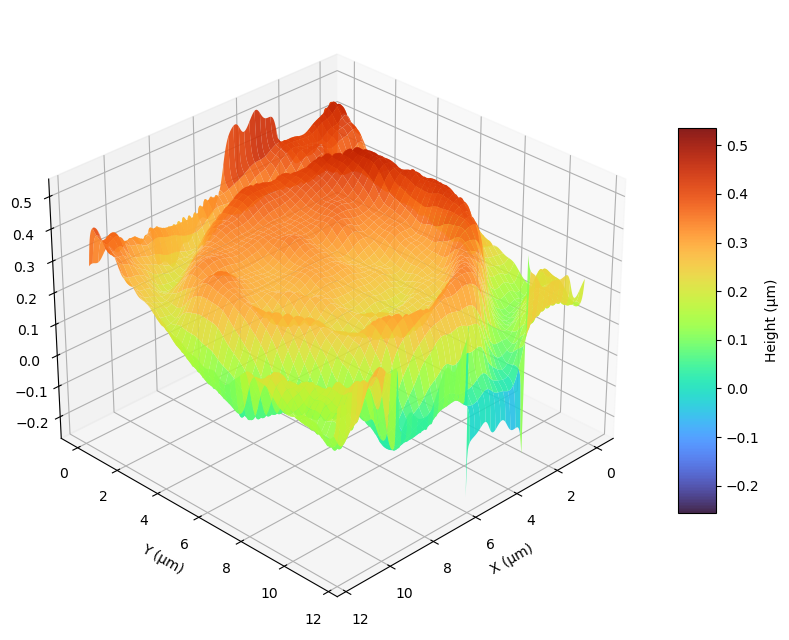

In [1150]:
plot_3D_phase(phase_unwrapped)

## Full function for creating a 3D plot of an erythrocyte

In [1489]:
def plot_3D_phase_from_image(img, pixel_size = 2.2, wavelength = 0.65, zoom = 80, mask_radius = 15, filter_radius = 10, standalone=True):
    fft = np.fft.fftshift(np.fft.fft2(img))
    spectrum = np.log(1 + np.abs(fft))
    f_x, f_y = find_plus_one_order_position(spectrum, mask_radius = mask_radius)
    filtered_spectrum = filter_spectrum(fft, f_x, f_y, radius=filter_radius)
    centered_spectrum = center_spectrum(filtered_spectrum, f_x, f_y)
    amplitude = np.fft.ifft2(np.fft.ifftshift(centered_spectrum))
    phase_wrapped = np.angle(amplitude)
    phase_unwrapped = np.unwrap(np.unwrap(phase_wrapped, axis=1), axis=0)
    plot_3D_phase(phase_unwrapped, pixel_size = pixel_size, wavelength = wavelength, zoom = zoom, standalone=standalone)

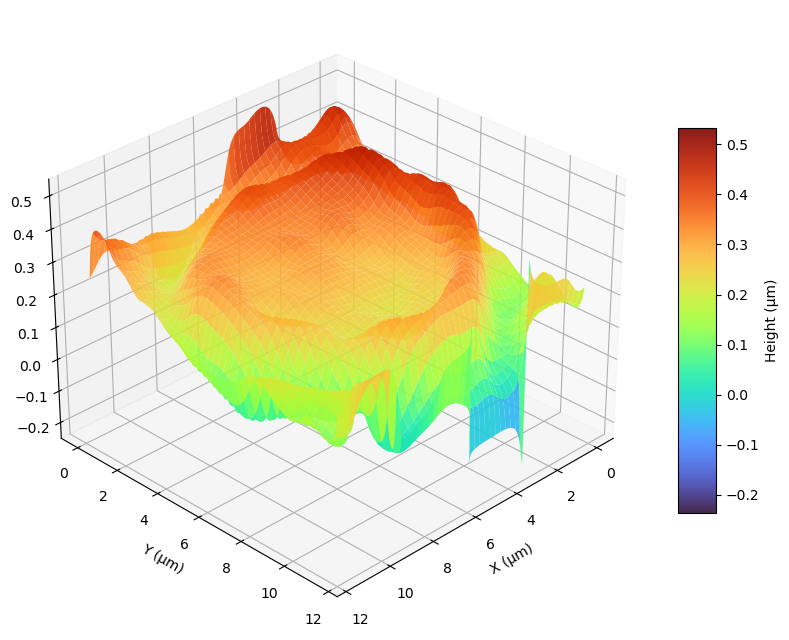

In [1491]:
plot_3D_phase_from_image(img)

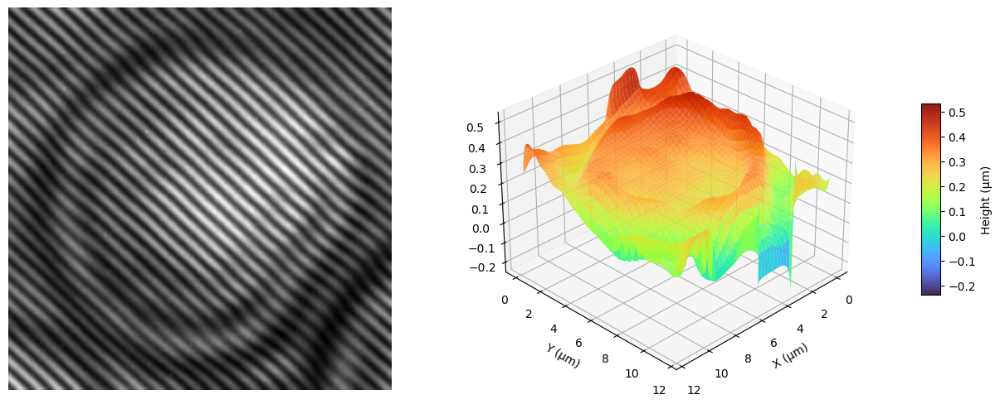

In [1124]:
img1 = cv2.imread("erythrocite_images/presentation_img.png", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.axis('off')

plot_3D_phase_from_image(img1, standalone=False)

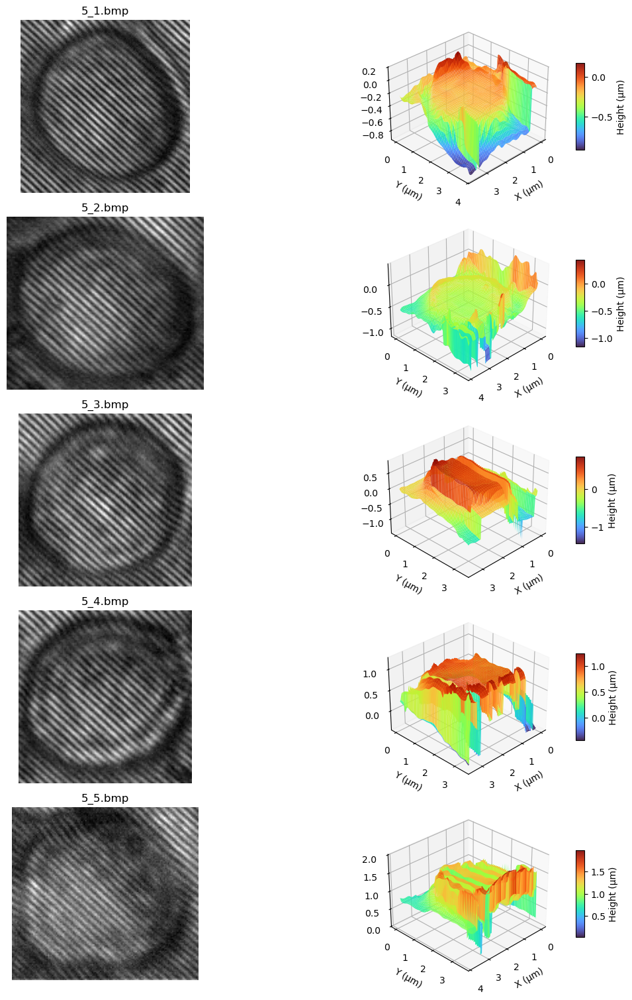

In [1160]:
import os
import cv2
import matplotlib.pyplot as plt

files = os.listdir("erythrocite_images/single_erythrocytes_5")
files.sort()


n_show = 5
files = files[:n_show]

fig = plt.figure(figsize=(12, 3*n_show))

for idx, filename in enumerate(files):
    image = cv2.imread("erythrocite_images/single_erythrocytes_5/" + filename, cv2.IMREAD_GRAYSCALE)

    ax1 = plt.subplot(n_show, 2, idx*2 + 1)
    ax1.imshow(image, cmap='gray')
    ax1.set_title(filename)
    ax1.axis('off')

    ax2 = plt.subplot(n_show, 2, idx*2 + 2, projection='3d')


    plot_3D_phase_from_image(image, standalone=False)

plt.tight_layout()
plt.show()

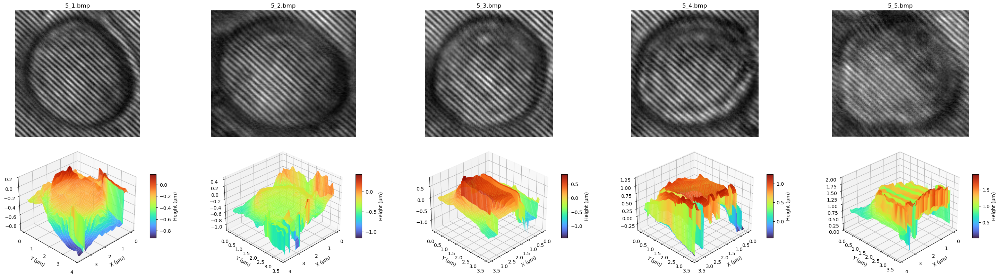

In [1178]:
import os
import cv2
import matplotlib.pyplot as plt

files = os.listdir("erythrocite_images/single_erythrocytes_5")
files.sort()

n_show = 5
files = files[:n_show]

fig = plt.figure(figsize=(6*n_show, 8))

for idx, filename in enumerate(files):
    image = cv2.imread("erythrocite_images/single_erythrocytes_5/" + filename, cv2.IMREAD_GRAYSCALE)


    ax1 = plt.subplot(2, n_show, idx + 1)
    ax1.imshow(image, cmap='gray')
    ax1.set_title(filename)
    ax1.axis('off')

    ax2 = plt.subplot(2, n_show, n_show + idx + 1, projection='3d')
    plot_3D_phase_from_image(image, standalone=False)

plt.tight_layout()
plt.show()

# Averging phase from rotated images

In [1212]:
img = cv2.imread("erythrocite_images/single_erythrocytes_5/5_1.bmp", cv2.IMREAD_GRAYSCALE)

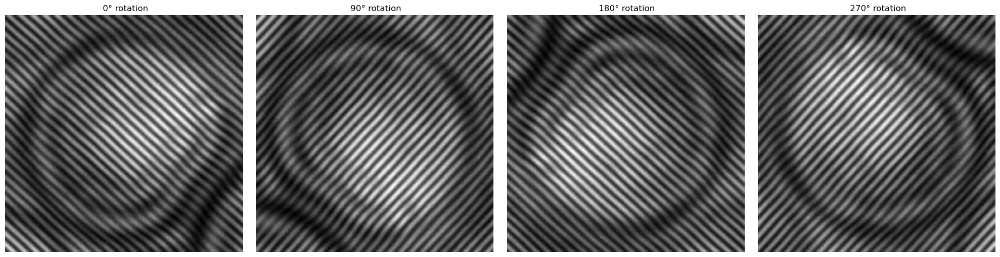

In [1483]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    
    ax.imshow(img_rotated, cmap='gray')
    ax.set_title(f' {i*90}° rotation')
    ax.axis("off")

plt.tight_layout()
plt.show()

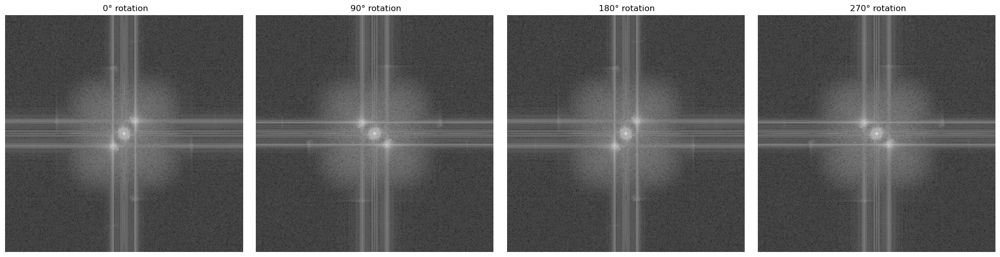

In [1485]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    
    ax.imshow(spectrum, cmap='gray')
    ax.set_title(f' {i*90}° rotation')
    ax.axis("off")

plt.tight_layout()
plt.show()

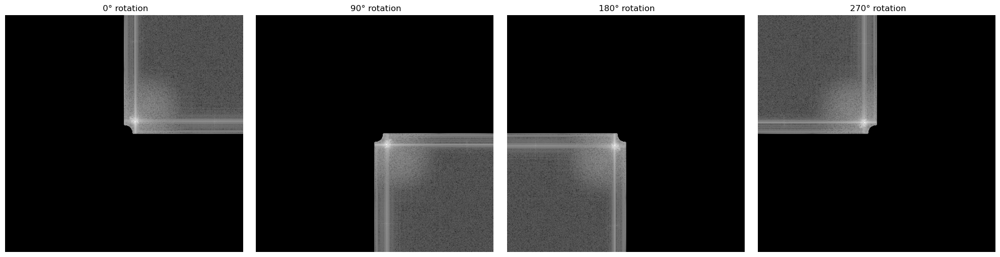

In [1487]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    spectrum_masked = mask_center(spectrum, rotation90 = -i)
    
    ax.imshow(spectrum_masked, cmap='gray')
    ax.set_title(f' {i*90}° rotation')
    ax.axis("off")

plt.tight_layout()
plt.show()

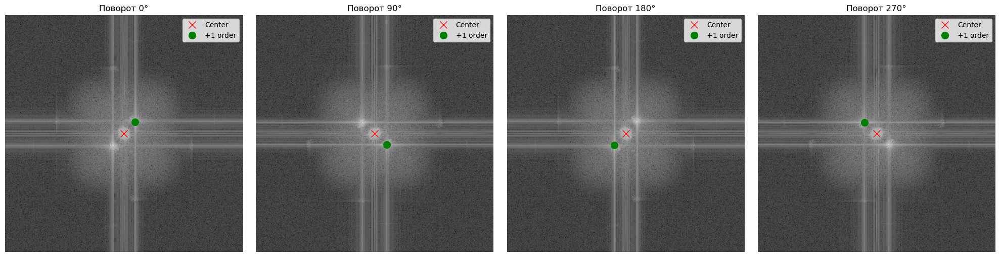

In [1447]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    f_x, f_y = find_plus_one_order_position(spectrum, rotation90 = -i)
    
    ax.imshow(spectrum, cmap='gray')
    ax.plot(cx, cy, 'rx', markersize=10, label='Center')
    ax.plot(f_x, f_y, 'go', markersize=10, label='+1 order')
    ax.legend()
    ax.set_title(f'Поворот {i*90}°')
    ax.axis("off")

plt.tight_layout()
plt.show()

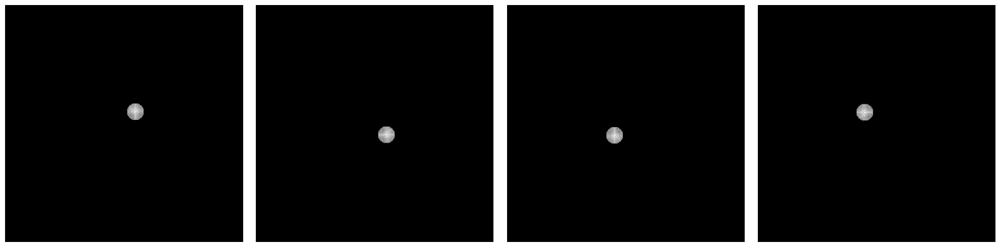

In [1455]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    f_x, f_y = find_plus_one_order_position(spectrum, rotation90 = -i)
    filtered_spectrum = filter_spectrum(fft, f_x, f_y, radius=15)
    ax.imshow(get_spectrum_image_from_fft(filtered_spectrum), cmap='gray')
    ax.axis('off')
    

plt.tight_layout()
plt.show()

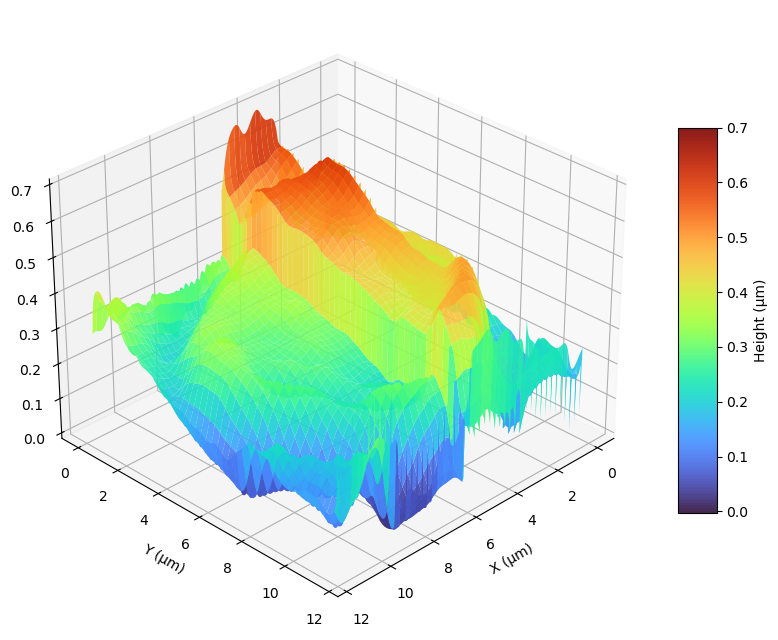

In [1505]:
h, w = img.shape
phase_total = np.zeros((h, w))
for i, ax in enumerate(axes):
    img_rotated = np.rot90(img, -i)
    fft = np.fft.fftshift(np.fft.fft2(img_rotated))
    spectrum = np.log(1 + np.abs(fft))
    f_x, f_y = find_plus_one_order_position(spectrum, rotation90 = -i)
    filtered_spectrum = filter_spectrum(fft, f_x, f_y, radius=15)
    centered_spectrum = center_spectrum(filtered_spectrum, f_x, f_y)
    amplitude = np.fft.ifft2(np.fft.ifftshift(centered_spectrum))
    phase_wrapped = np.angle(amplitude)
    phase_unwrapped = np.unwrap(np.unwrap(phase_wrapped, axis=1), axis=0)
    phase_unwrapped_back = np.rot90(phase_unwrapped, k=i)
    phase_total += phase_unwrapped_back
    
phase_avg = phase_total / 4
    
plot_3D_phase(phase_avg)

## Enhancing interference fringes contrast

In [68]:
def enhance_fringes_contrast(img, boost_factor=2.0, mask_radius=20, filter_radius=15):
    fft = np.fft.fftshift(np.fft.fft2(img))
    h, w = img.shape
    cy, cx = h//2, w//2

    Y, X = np.ogrid[:h, :w]
    center_mask = (X-cx)**2 + (Y-cy)**2 <= mask_radius**2
    spectrum = np.abs(fft)
    spectrum_masked = spectrum.copy()
    spectrum_masked[center_mask] = 0

    max_y, max_x = np.unravel_index(np.argmax(spectrum_masked), spectrum_masked.shape)

    pos_mask = (Y - max_y)**2 + (X - max_x)**2 < filter_radius**2
    fft[pos_mask] *= boost_factor

    enhanced_img = np.abs(np.fft.ifft2(np.fft.ifftshift(fft)))

    return enhanced_img

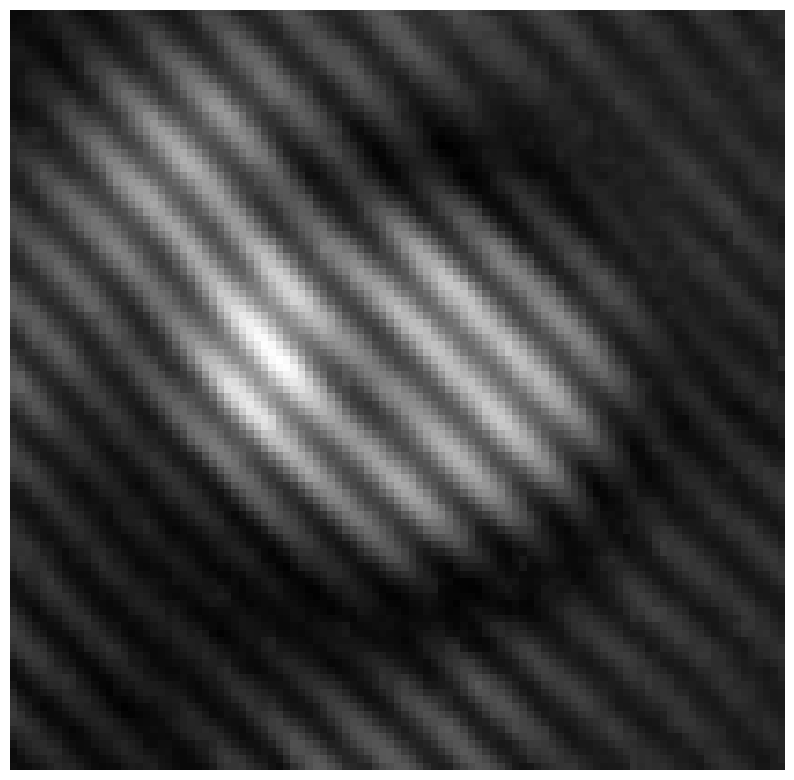

In [75]:
img16 = cv2.imread("Img16_1.bmp", cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10, 10))
plt.imshow(img16, cmap='gray')
plt.axis('off')
plt.show()

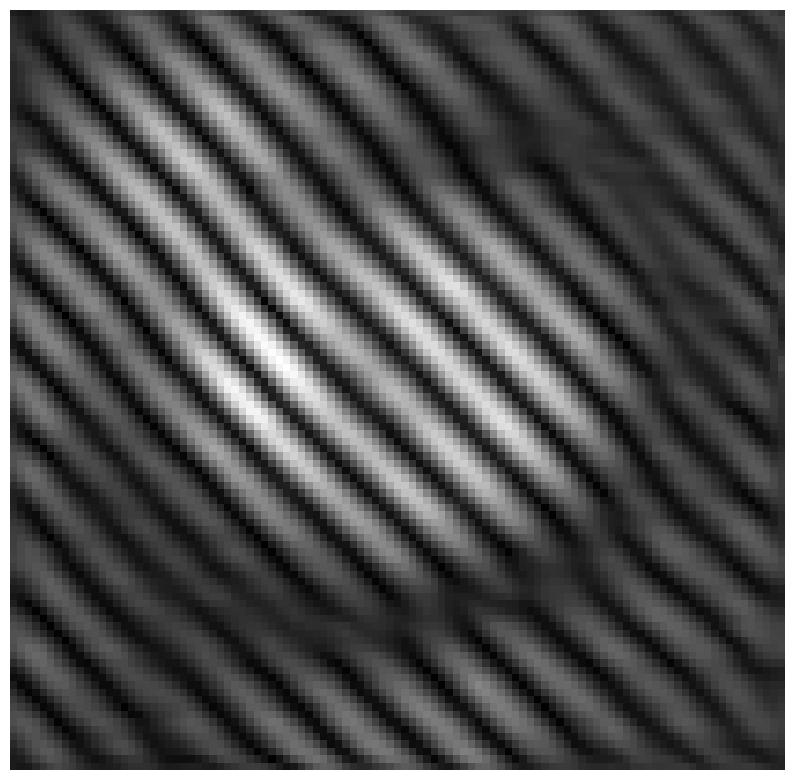

In [74]:
enahnced_img16 = enhance_fringes_contrast(img16, boost_factor = 10)
plt.figure(figsize=(10, 10))
plt.imshow(enahnced_img16, cmap='gray')
plt.axis('off')
plt.show()

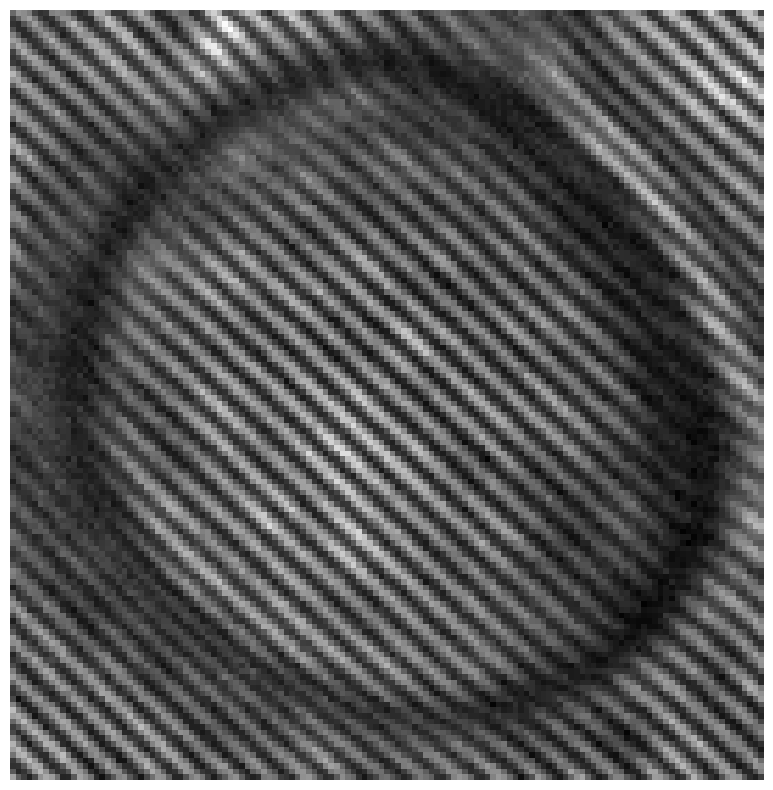

In [59]:
img = cv2.imread("/content/single_erythrocytes_5/5_1.bmp", cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

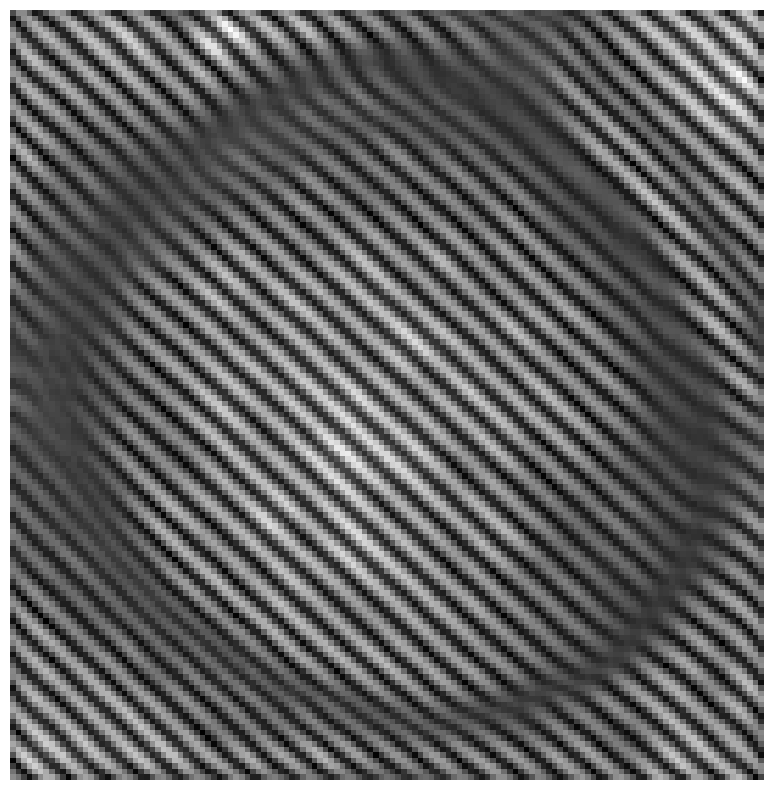

In [76]:
plt.figure(figsize=(10, 10))
plt.imshow(enhance_fringes_contrast(img, boost_factor=10), cmap='gray')
plt.axis('off')
plt.show()